<a href="https://colab.research.google.com/github/Toizzystradlin/pcb_inspection/blob/master/v2_PCB_inspection_opencv2_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
импортируем библиотеки, потом загружаем 2 файла с печатными платами: с браком и нормальную.

In [53]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from skimage.measure import compare_ssim

читаем изображения, показываем их

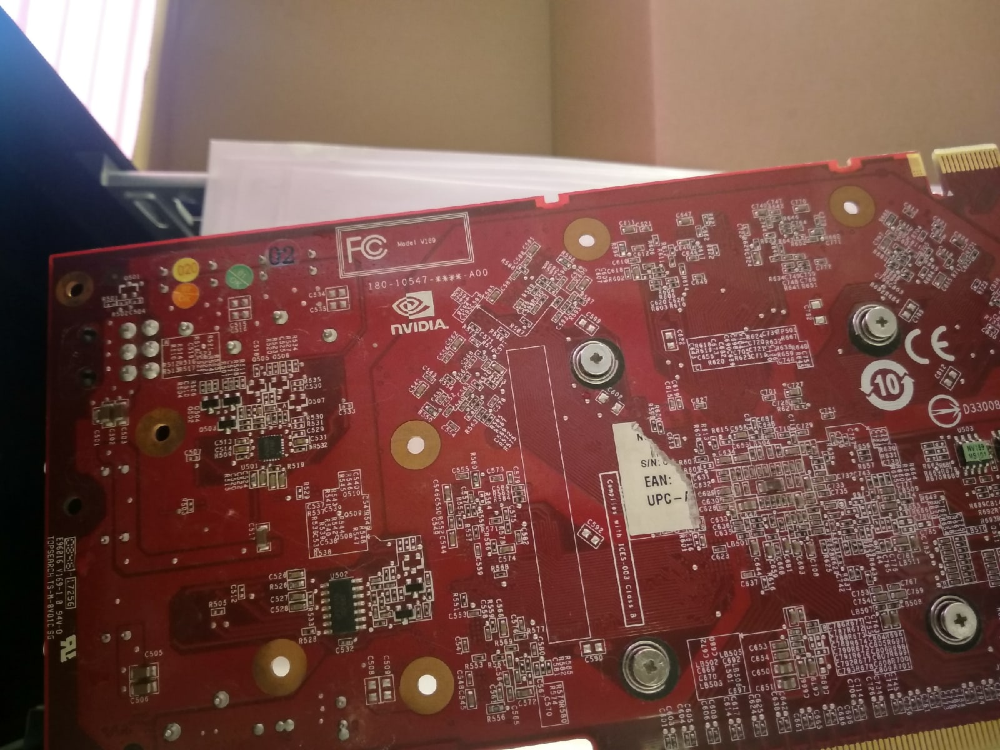

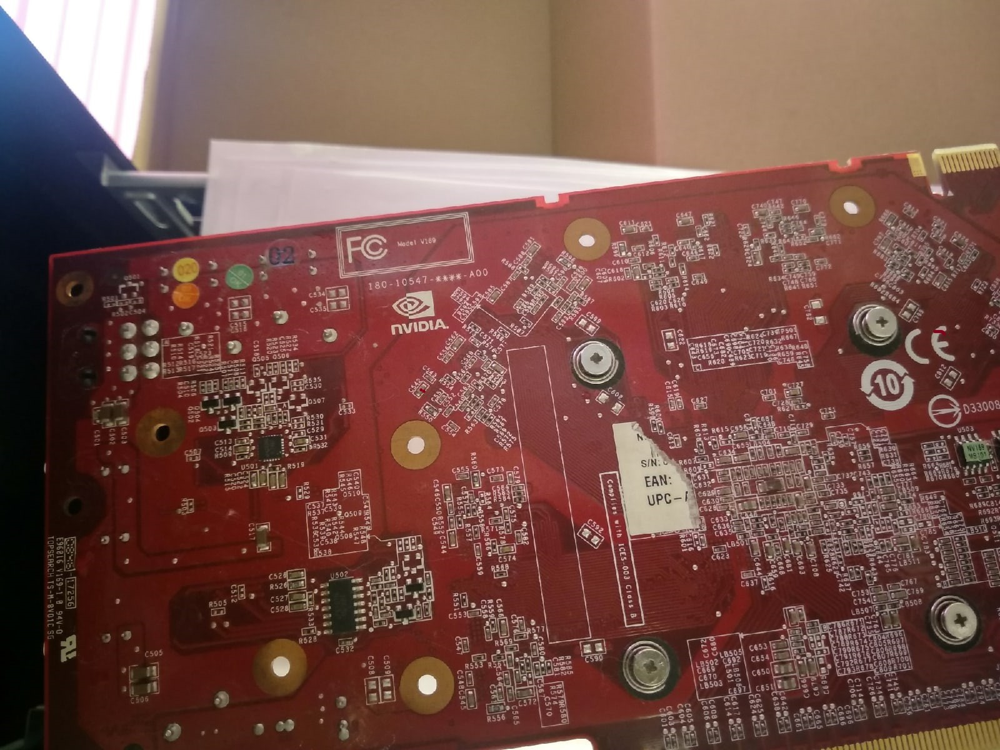

In [223]:
img1 = cv2.imread('1.jpg', cv2.IMREAD_COLOR)
img2 = cv2.imread('2_defected.jpg', cv2.IMREAD_COLOR)
#img1 = cv2.blur(img1,(3,3))
#img2 = cv2.blur(img2,(3,3))
#img1 = cv2.GaussianBlur(img1,(3,3),0)
#img2 = cv2.GaussianBlur(img2,(3,3),0)

#img1 = cv2.resize(img1, (320,240), interpolation=cv2.INTER_AREA)
#img2 = cv2.resize(img2, (320,240), interpolation=cv2.INTER_AREA)
#img1 = img1[50:320, 0:240]
#img2 = img2[50:320, 0:240]
cv2_imshow(img1)
img1.shape
img2.shape
cv2_imshow(img2)
cv2.waitKey(0)
cv2.destroyAllWindows()

размер ячеек


In [166]:
print(img1.shape)
print(img2.shape)

(190, 240, 3)
(190, 240, 3)


главный код. сначала конвертируем в серый, потом в бинарный формат (черно белый) потом XOR операция

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  This is separate from the ipykernel package so we can avoid doing imports until


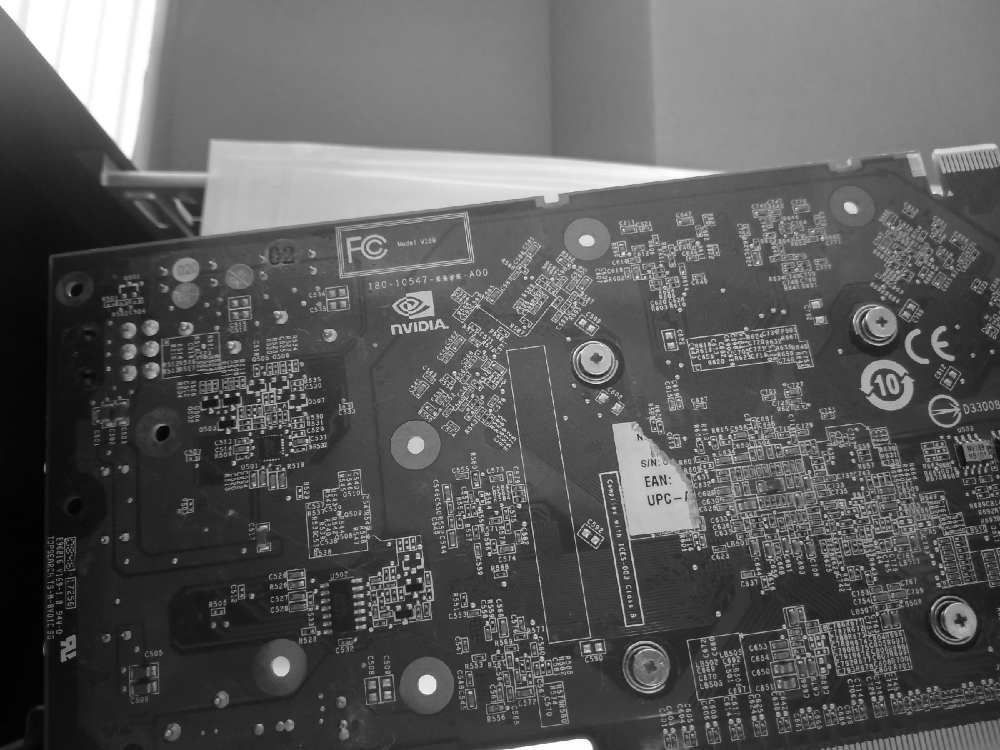

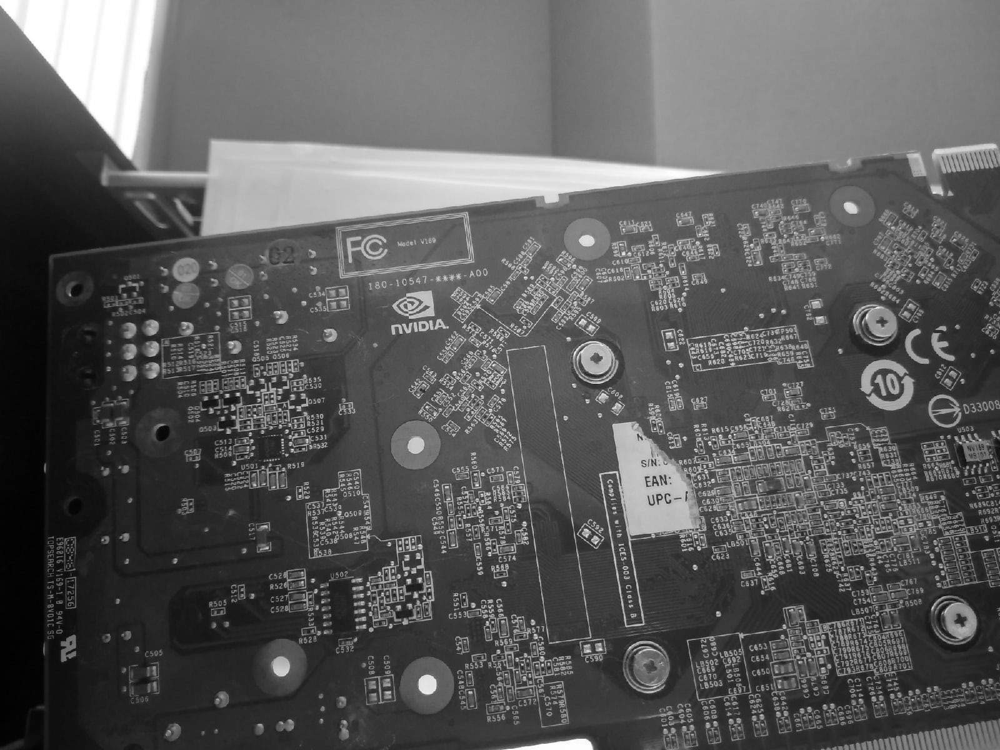

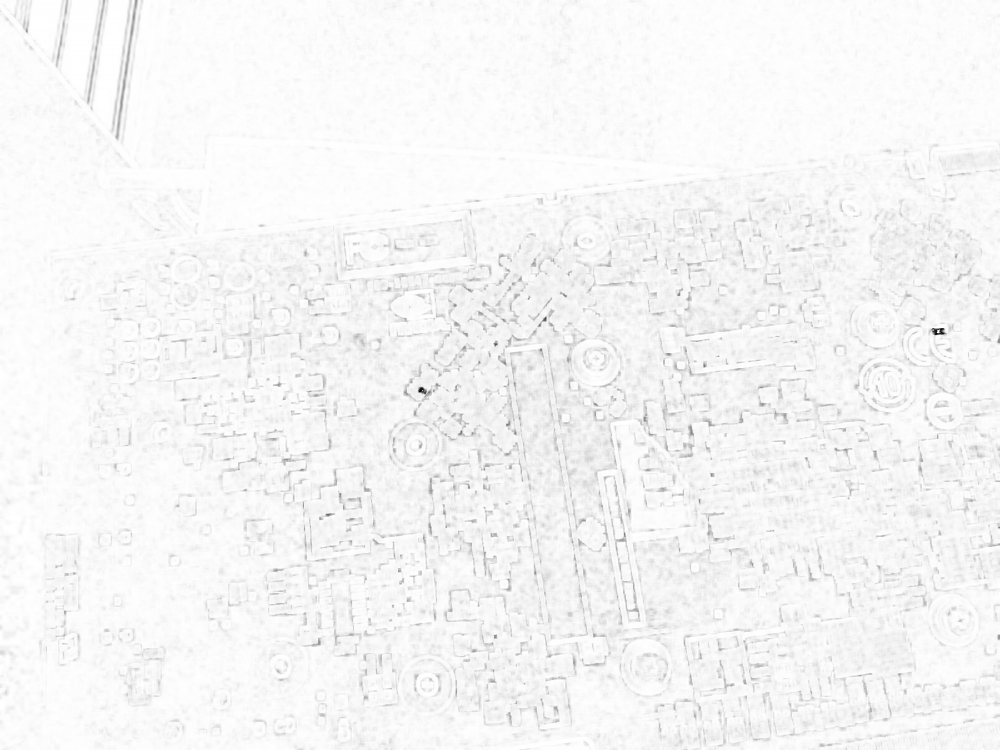

0.9641454663142306


In [224]:
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
(score, diff) = compare_ssim(gray1, gray2, full=True)
diff = (diff * 255).astype("uint8")
#ret, thresh1 = cv2.threshold(gray1, 150, 255, 0)
#ret, thresh2 = cv2.threshold(gray2, 150, 255, 0)
#res = cv2.bitwise_xor(thresh1, thresh2, mask=None)
#cv2_imshow(res)
cv2_imshow(gray1)
cv2_imshow(gray2)
cv2_imshow(diff)
print(score)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

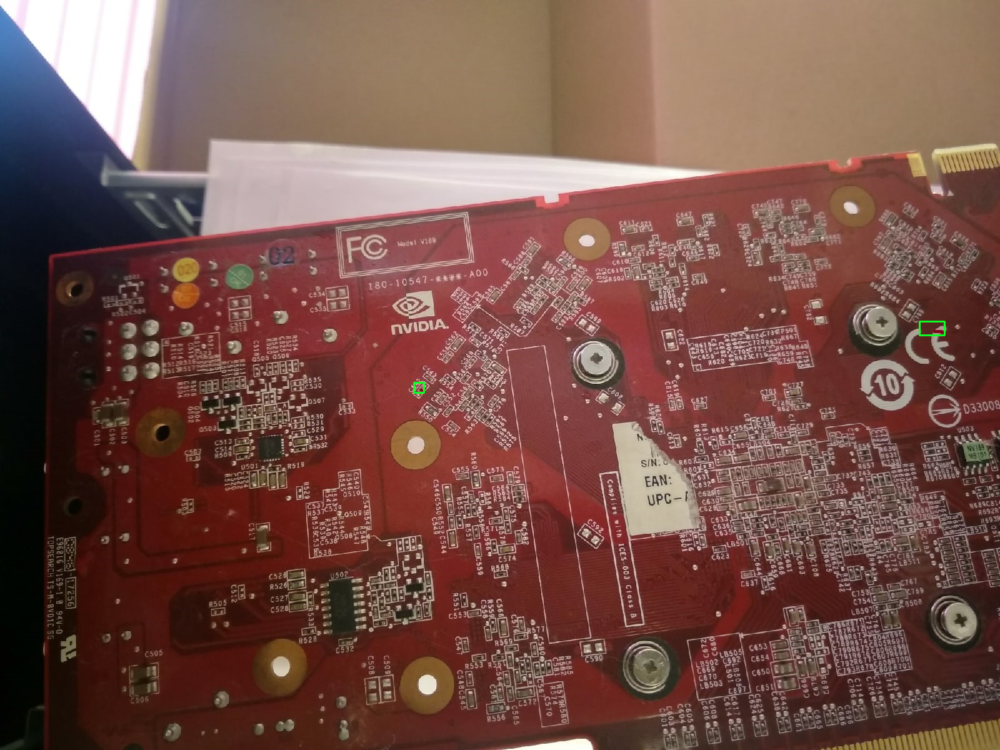

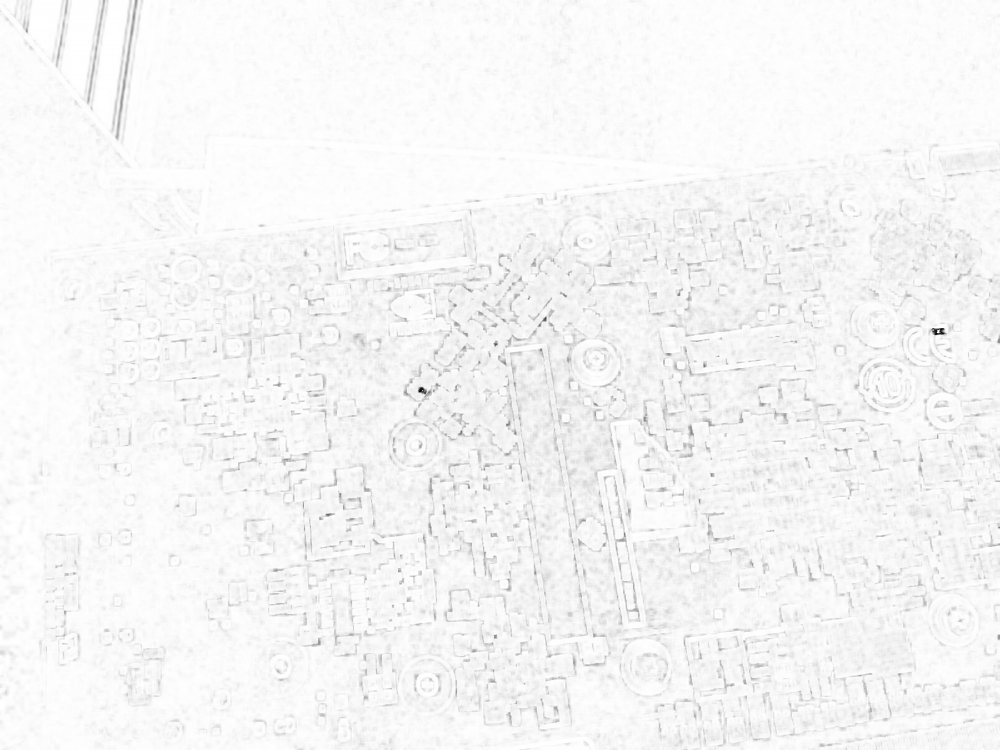

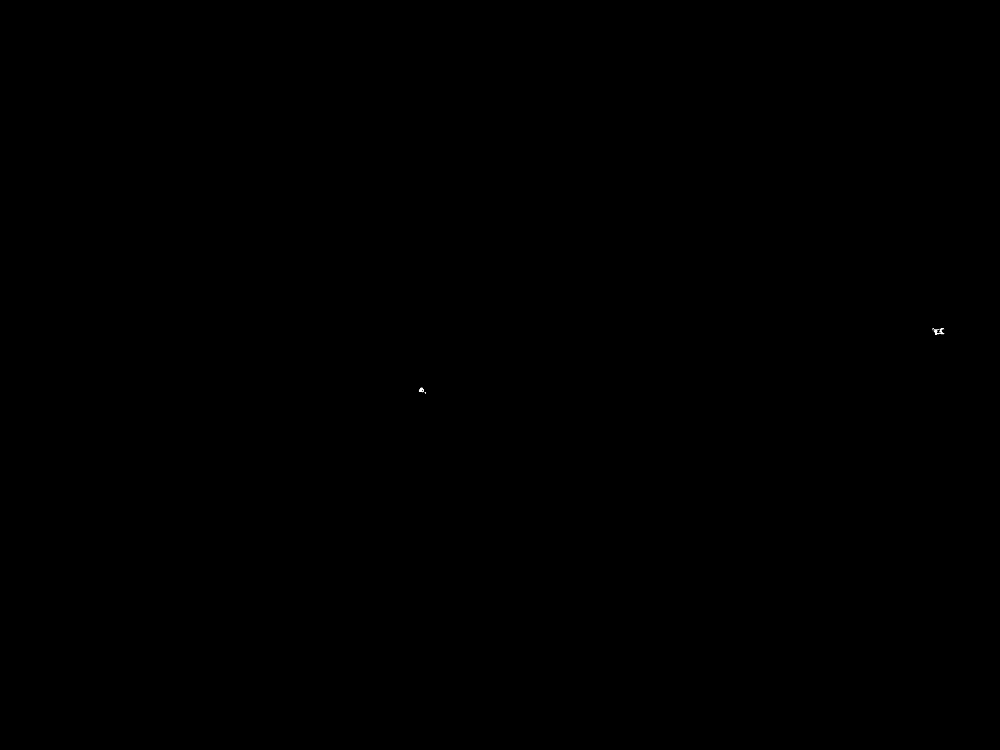

-1

In [225]:
#thresh = cv2.threshold(diff, 254, 255, cv2.THRESH_BINARY)[1]
ret3,thresh = cv2.threshold(diff,69,255,cv2.THRESH_BINARY_INV)
#thresh = cv2.adaptiveThreshold(diff,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
        #   cv2.THRESH_BINARY,11,2)
contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
contours = contours[0] if len(contours) == 2 else contours[1]
mask = np.zeros(img1.shape, dtype='uint8')
filled_after = img2.copy()

for c in contours:
    area = cv2.contourArea(c)
    if area > 20:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(img1, (x - w, y - h), (x + w, y + h), (36,255,12), 2)
        cv2.rectangle(img2, (x - w, y - h), (x + w, y + h), (36,255,12), 2)
        cv2.drawContours(mask, [c], 0, (0,255,0), -1)
        cv2.drawContours(filled_after, [c], 0, (0,255,0), -1)
#cv2_imshow(img1)
cv2_imshow(img2)
cv2_imshow(diff)
cv2_imshow(thresh)
#cv2_imshow(mask)
#cv2_imshow(filled_after)
cv2.waitKey(0)